# Overview

This notebook visualizes data from the [Jiang et al. 2021](https://www.frontiersin.org/articles/10.3389/fcell.2021.743421/full) zebrafish cell atlas, sample ["Brain8"](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM3768152), in gene and Orthogroup spaces.

# 0. Setup

Import packages and specify any important functions here.


If `arcadia_pycolor` is not yet installed, run:
```
!pip install git+https://github.com/Arcadia-Science/arcadia-pycolor.git#egg=arcadia_pycolor --upgrade
```

In [43]:
# import standard python packages
import pandas as pd
import subprocess
import os
import dill
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
import numpy as np
import arcadia_pycolor as apc
import plotly.express as px

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=apc.arcadia_All_ordered.values())
mpl.rcParams['pdf.fonttype'] = 42

# add the utils and env directories to the path
import sys
sys.path.append('../../utils/')
sys.path.append('../../env/')

# import functions from utils directory files
from string_functions import *
from biofile_handling import *
from scanpy_wrappers import *

# import paths to software installs from env
from install_locs import *

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.7


# 1. Load BioFileDocket

Load in the BioFileDocket file for this dataset using `BioFileDocket.unpickle()`

In [2]:
################
# general info #
################

# Specify the name of the species folder in Amazon S3
species = 'Danio_rerio'

# Specify any particular identifying conditions, eg tissue type:
conditions = 'adultbrain'

################

sample_BFD = BioFileDocket(species, conditions).get_from_s3().unpickle()
sample_BFD.s3_to_local()

/home/ec2-user/glial-origins/output/Drer_adultbrain/ already exists
Files will be saved into /home/ec2-user/glial-origins/output/Drer_adultbrain/
file Drer_adultbrain_BioFileDocket.pkl already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_adultbrain_BioFileDocket.pkl
file GCF_000002035.5_GRCz10_genomic.gff already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/GCF_000002035.5_GRCz10_genomic.gff
file GCF_000002035.5_GRCz10_genomic.fna already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/GCF_000002035.5_GRCz10_genomic.fna
file GSM3768152_Brain_8_dge.txt already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/GSM3768152_Brain_8_dge.txt
file Drer_adultbrain_ZFIN_UniProtIDs.txt already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_adultbrain_ZFIN_UniProtIDs.txt
file Drer_adultbrain_uniprot-idmm.tsv already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_adultbrain_uniprot-idmm.tsv
file

# 2. Load Gxc/Exc matrices

Load in and inspect the genes by cells and embedding by cells matrices.

In [3]:
gxc = pd.read_csv(sample_BFD.gxc.path, sep = '\t', nrows = 10)
display(gxc)
exc = pd.read_csv(sample_BFD.Orthogroup_exc.path, sep = '\t', nrows = 10)
display(exc)

,GENE,ACAATATATTGTACCTGA,ACGTTGATGGCGTAGAGA,AACCTAACCTGAATTTGC,CTCGCAGCCCTCTATGTA,ACGTTGCGTATTTAGTCG,AACCTATAGAGACCGACG,ACGAGCGCTGTGGCCTAG,GCGAATGGACATGGACAT,TCTACCGCTCAAGCTCAA,...,CGGCAGTCAAAGATCTCT,GACACTGCGAATCTGTGT,GCAGGAGGCTGCTAAGGG,TATGTATACTTCCGCACC,TGGATGTTCCGCACAATA,AACCTATGGATGGGGTTT,AAGCGGAGGACTCTCCAT,ACCTGACTCGCAAGCGAG,ACGTTGCAAAGTTTCATA,ATCAACTGCAATTTCCGC
0,ABCF3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,ACOT12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,ACSF3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,ACTC1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,ACVR1C,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,ADAM12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,ADAMTSL4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,ADGRL3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,AKAP13,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,AL590134.1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


,Orthogroup,ACAATATATTGTACCTGA,ACGTTGATGGCGTAGAGA,AACCTAACCTGAATTTGC,CTCGCAGCCCTCTATGTA,ACGTTGCGTATTTAGTCG,AACCTATAGAGACCGACG,ACGAGCGCTGTGGCCTAG,GCGAATGGACATGGACAT,TCTACCGCTCAAGCTCAA,...,CGGCAGTCAAAGATCTCT,GACACTGCGAATCTGTGT,GCAGGAGGCTGCTAAGGG,TATGTATACTTCCGCACC,TGGATGTTCCGCACAATA,AACCTATGGATGGGGTTT,AAGCGGAGGACTCTCCAT,ACCTGACTCGCAAGCGAG,ACGTTGCAAAGTTTCATA,ATCAACTGCAATTTCCGC
0,OG0000001,0,0,0,0,1,0,1,1,0,...,0,0,0,0,0,1,0,1,0,0
1,OG0000005,0,1,0,0,0,0,1,0,0,...,0,2,0,0,0,0,0,0,0,0
2,OG0000009,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,OG0000013,0,1,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,0,0,0
4,OG0000014,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,OG0000016,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,OG0000018,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,OG0000021,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,OG0000028,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,OG0000030,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 3A. Load gxc matrix into scanpy
Cells with the letter "A" in the step number are analyses related to the original gene feature space.  
Cells with the letter "B" in the step number are analyses related to the shared feature space (for this notebook, Orthogroups).

In [4]:
scanpy_data = ScanpyMetaObject(
    matrix = sample_BFD.gxc,
    sampledict = sample_BFD.sampledict
    )
scanpy_data.read()

... reading from cache file cache/home-ec2-user-glial-origins-output-Drer_adultbrain-GSM3768152_Brain_8_dge.h5ad


# 4A. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell
    finished (0:00:03)


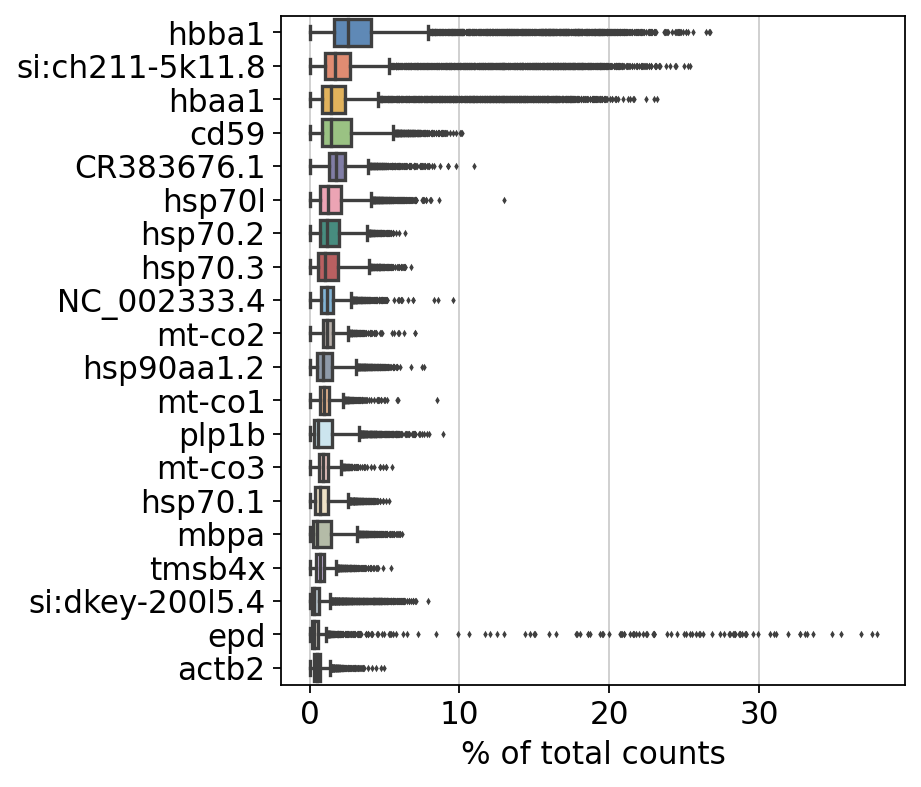

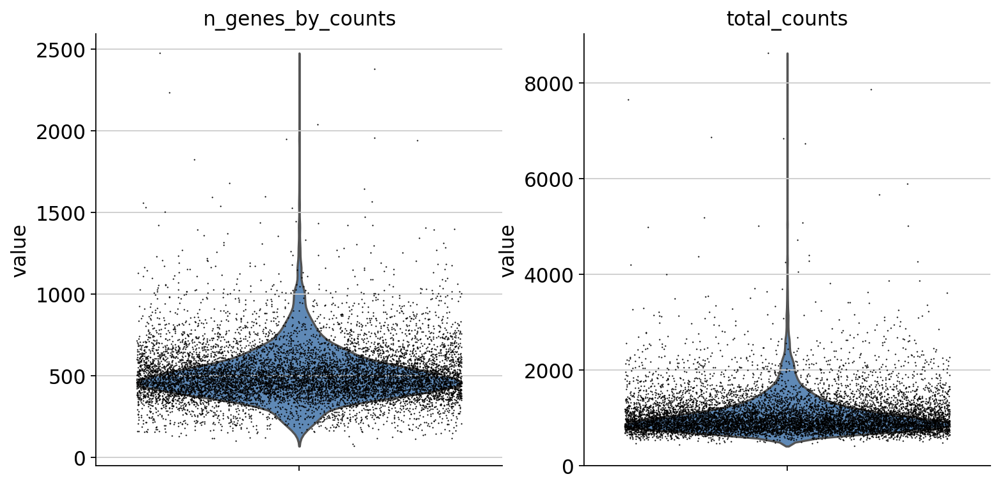

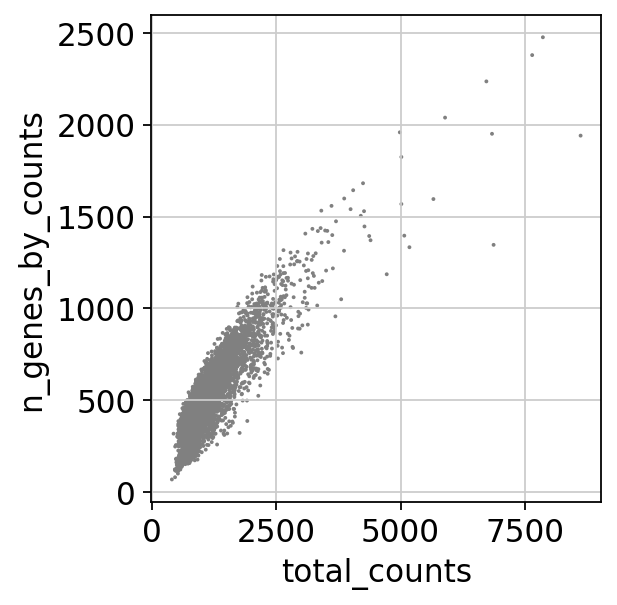

filtered out 2 cells that have less than 100 genes expressed
filtered out 8708 genes that are detected in less than 20 cells


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


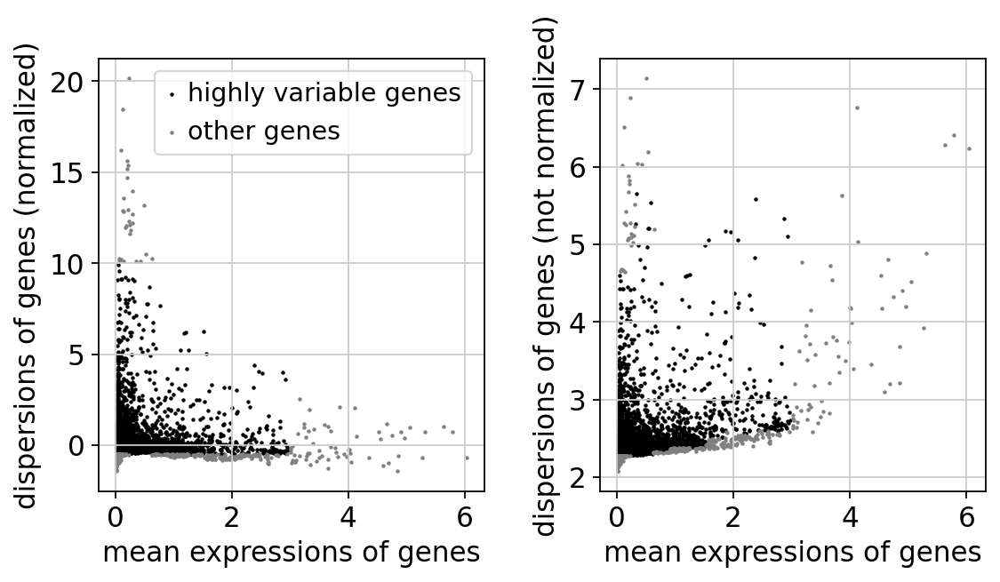

regressing out ['total_counts']
    finished (0:02:00)


In [5]:
sc.pl.highest_expr_genes(scanpy_data.adata, n_top=20, )
scanpy_data.violin()
scanpy_data.cellgene_filter(min_genes=100, min_cells=20)
scanpy_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
scanpy_data.variable_filter(min_mean = 0.0125, max_mean = 3, min_disp = -0.5, max_disp = 10)
scanpy_data.regress_scale(how = ['total_counts'], max_value = 10)

### Map cell type annotations

In [6]:
scanpy_data.map_cellannots(sample_BFD.cellannot)

# 5A. Run PCA and UMAP/Leiden on gxc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)


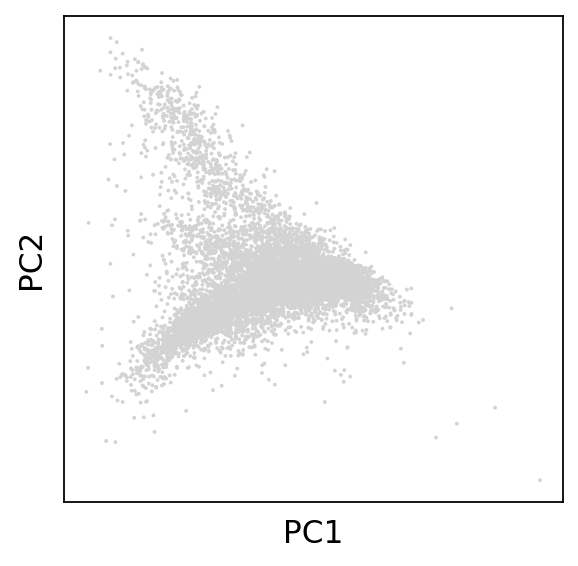

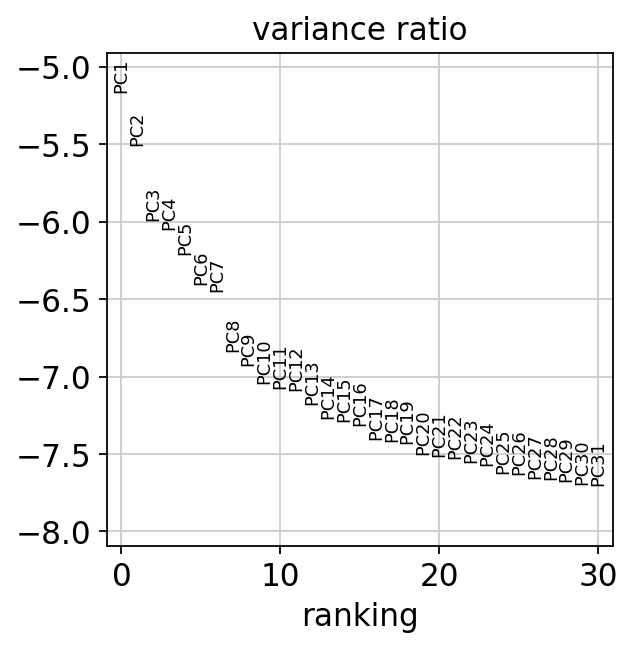

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


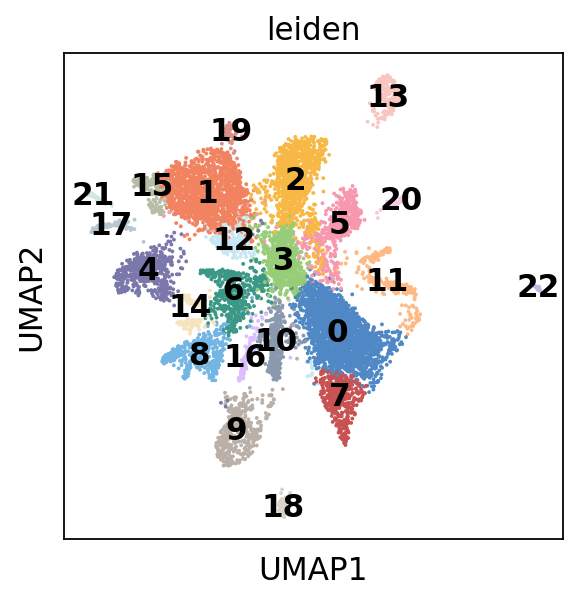

In [7]:
scanpy_data.pca_basic()
scanpy_data.umap_leiden(palette = list(apc.arcadia_All_ordered.keys()))

# 6A. Plot expression of glial markers in gxc data

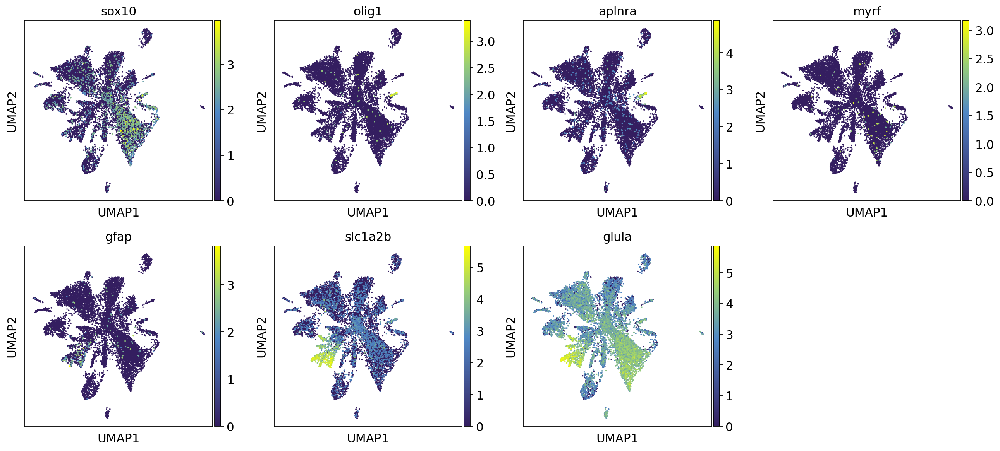

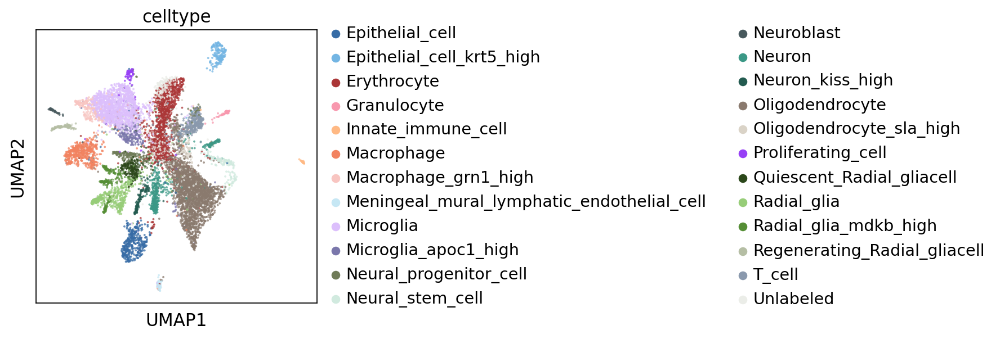

In [8]:
# marker genes of glia and other cells pulled from literature
glial_markers = ['sox10', 'olig1', 'aplnra', 'myrf', 'gfap', 'slc1a2b', 'glula']
sc.pl.umap(scanpy_data.adata, color=glial_markers, cmap= 'arcadia:viridis',
           save = '_'.join([sample_BFD.species_prefix, 'Gene', 'glial-markers', 'scatter.pdf']))

celltype_palette = {
    # unlabeled, lightgrey
    'Unlabeled': apc.arcadia_Core['arcadia:lightgrey'],
    
    # myeloid cells, dragon-orange-rose-amber
    'Erythrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dragon'], 0.8),
    'Innate_immune_cell': apc.arcadia_Accent_all['arcadia:orange'],
    'Granulocyte': apc.arcadia_Accent_all['arcadia:rose'],
    'Macrophage': apc.arcadia_Accent_all['arcadia:amber'],
    'Macrophage_grn1_high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dress'], 1),
    
    # lymphoid cells, 
    'T_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:marineblue'], 1),
    
    # radial glia: lime-sage
    'Regenerating_Radial_gliacell': apc.arcadia_Accent_all['arcadia:sage'],
    'Radial_glia': apc.arcadia_Accent_all['arcadia:lime'],
    'Radial_glia_mdkb_high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.6),
    'Quiescent_Radial_gliacell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.3),
    
    # microglia, aster-periwinkle
    'Microglia': apc.arcadia_Accent_all['arcadia:periwinkle'],
    'Microglia_apoc1_high': apc.arcadia_Accent_all['arcadia:aster'],
    'Proliferating_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:periwinkle'], 0.7),
    
    # epithelial cells, aegean-wish-vitalblue
    'Epithelial_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:aegean'], 0.8),
    'Epithelial_cell_krt5_high': apc.arcadia_Accent_all['arcadia:vitalblue'],
    'Meningeal_mural_lymphatic_endothelial_cell': apc.arcadia_Accent_all['arcadia:bluesky'],
    
    # oligodendrocytes: chateau-taupe
    'Oligodendrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:chateau'], 0.7),
    'Oligodendrocyte_sla_high': apc.arcadia_Accent_all['arcadia:taupe'],
    
    # neuron: seaweed-mint-forest
    'Neuron': apc.arcadia_Accent_all['arcadia:seaweed'],
    'Neuron_kiss_high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:seaweed'], 0.6),
    'Neuroblast': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 0.8),
    'Neural_stem_cell': apc.arcadia_Accent_all['arcadia:mint'],
    'Neural_progenitor_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:sage'], 0.6),
}

# Also plot celltype from cell annotation
celltype_fig = sc.pl.umap(scanpy_data.adata, color='celltype', alpha = 0.75, palette = celltype_palette, 
                          save = '_'.join([sample_BFD.species_prefix, 'Gene', 'celltypes', 'scatter.pdf']))

### Generate confusion matrix

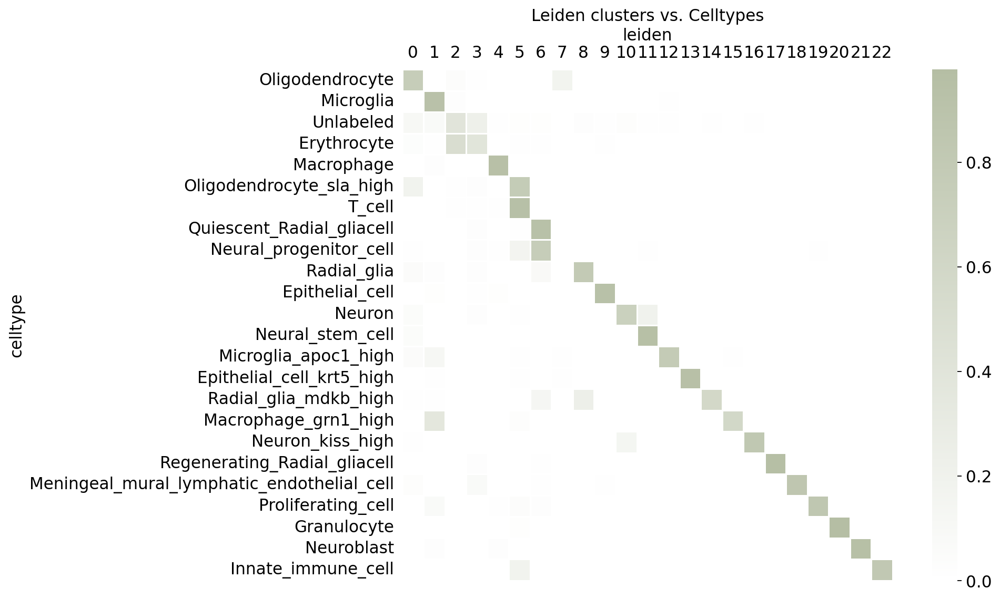

In [60]:
ctmx = sc.metrics.confusion_matrix("celltype", "leiden", scanpy_data.adata.obs)
ctmx_diag = diagonalize_df(ctmx)

plt.figure(figsize = (12, 8))
sns.heatmap(ctmx_diag, square = True, cmap = 'arcadia:sages', linewidth = 0.5)
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.tick_params(left = False, top = False)
plt.title('Leiden clusters vs. Celltypes')
plt.savefig(sample_BFD.directory + sample_BFD.species_prefix + '_Leiden-vs-Celltypes-confusion-Genes.pdf')

### Generate hover-over confusion matrix using Plotly

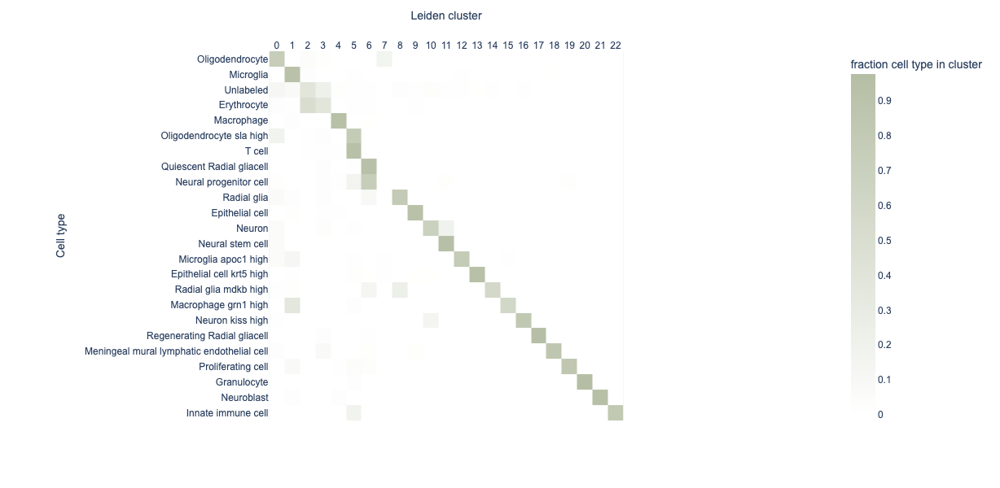

In [61]:
ctmx_diag.index = [label.replace('_', ' ') for label in ctmx_diag.index]
pxfig = px.imshow(ctmx_diag, labels = dict(x = "Leiden cluster", y = "Cell type", color = "fraction cell type in cluster"), color_continuous_scale = ['white', apc.arcadia_all['arcadia:sage']])
pxfig.update_layout(width = 900, height = 600)
try: 
    pxfig.update_layout(font=dict(family="Arial"))
except:
    pass
pxfig.update_xaxes(side = "top", title_text = "Leiden cluster")
pxfig.update_yaxes(title_text = "Cell type")

pxfig.write_html(sample_BFD.directory + sample_BFD.species_prefix + '_Leiden-vs-Celltypes-confusion-Genes.html')
pxfig.show()

# 7A. Get top marker genes and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.i

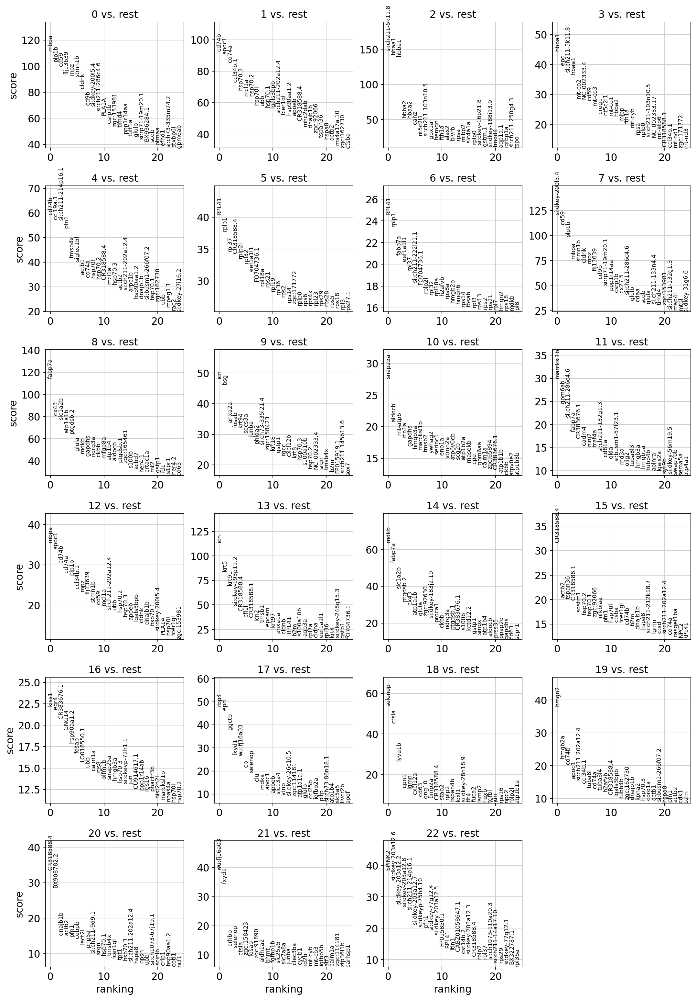

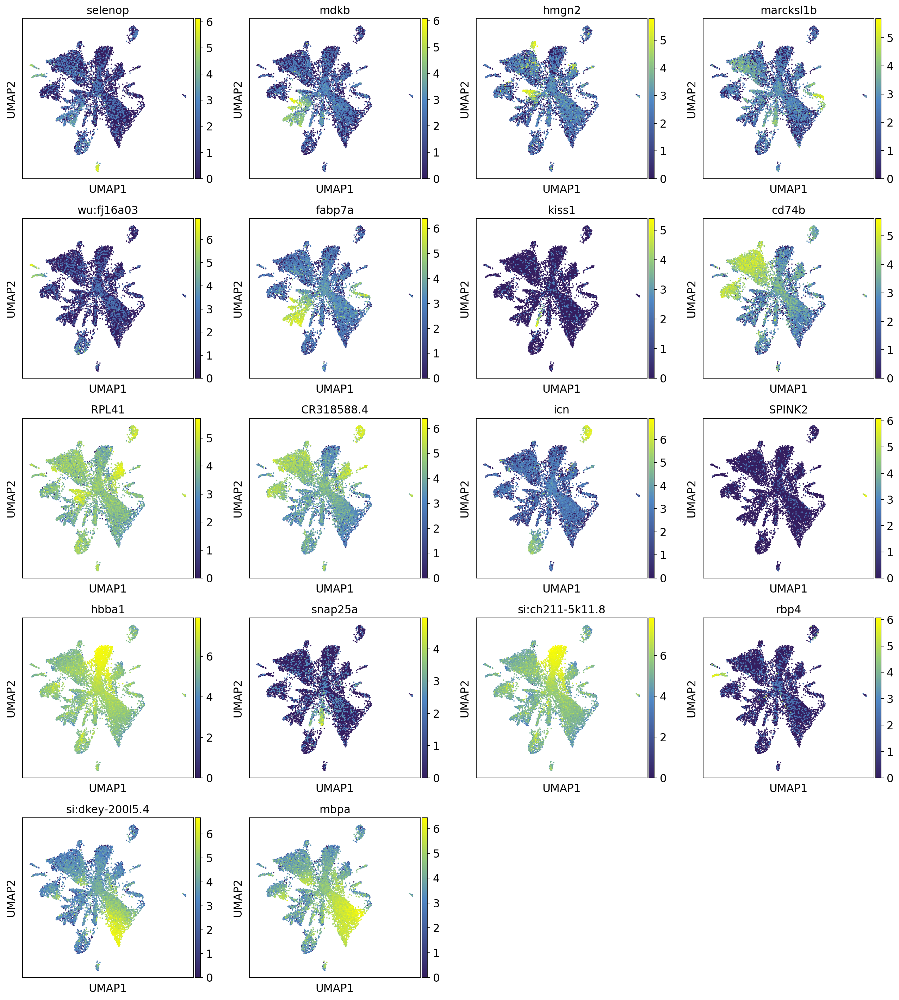

In [45]:
scanpy_data.rank_genes()
top_key, marker_key = scanpy_data.get_top_genes('gene-name')

# Running the line below exports top genes to file
#scanpy_data.export_top_genes(top_key)

sc.pl.umap(scanpy_data.adata, color=getattr(scanpy_data, marker_key), cmap = 'arcadia:viridis')

# 8A. Cluster-specific genes

You can plot the `top_n` genes from a given `cluster_num` here for exploratory purposes.

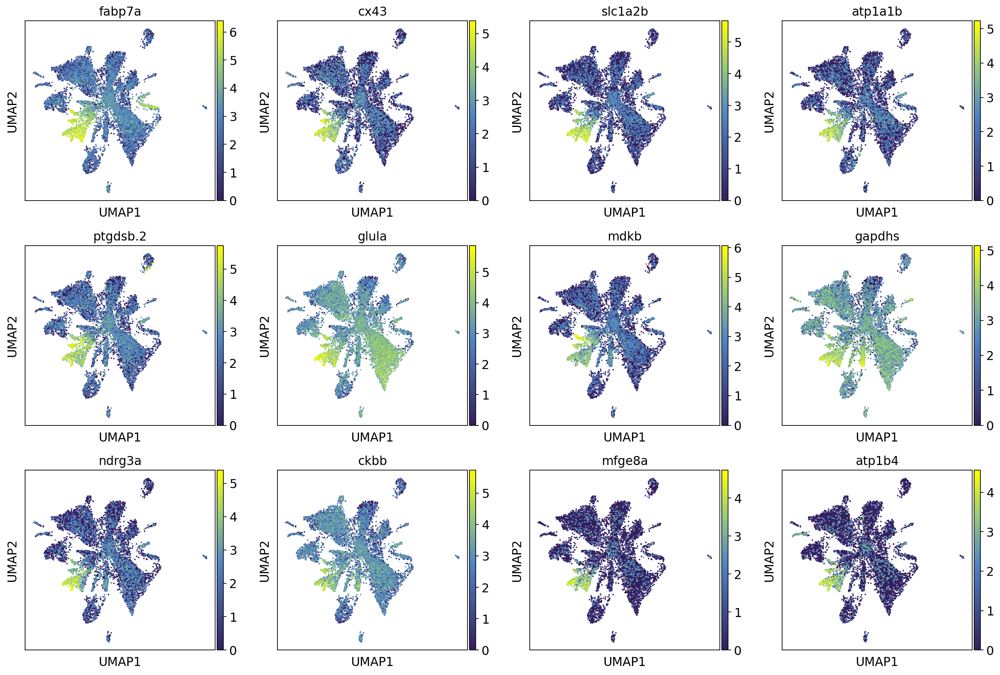

In [46]:
cluster_num = 8
top_n = 12
sc.pl.umap(scanpy_data.adata, 
           color=scanpy_data.marker_genes_df[str(cluster_num)].tolist()[0:top_n], 
           cmap = 'arcadia:viridis')

# 3B. Load exc matrix into scanpy

In [47]:
orthogroup_data = ScanpyMetaObject(
    matrix = sample_BFD.Orthogroup_exc,
    sampledict = sample_BFD.sampledict
    )
orthogroup_data.read()

... reading from cache file cache/home-ec2-user-glial-origins-output-Drer_adultbrain-GSM3768152_Brain_8_dge_asOrthogroup.h5ad


# 4B. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell
    finished (0:00:02)


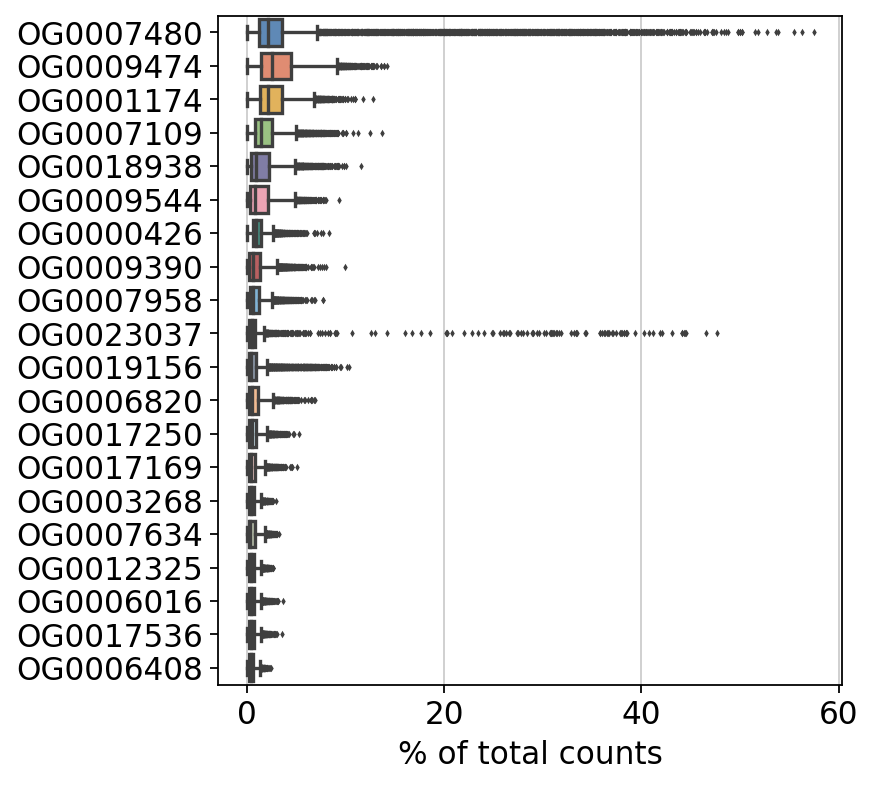

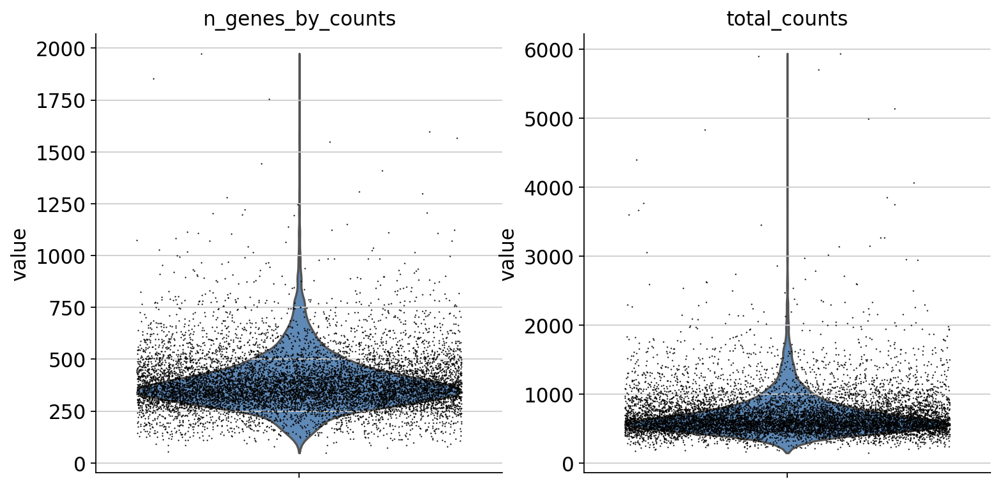

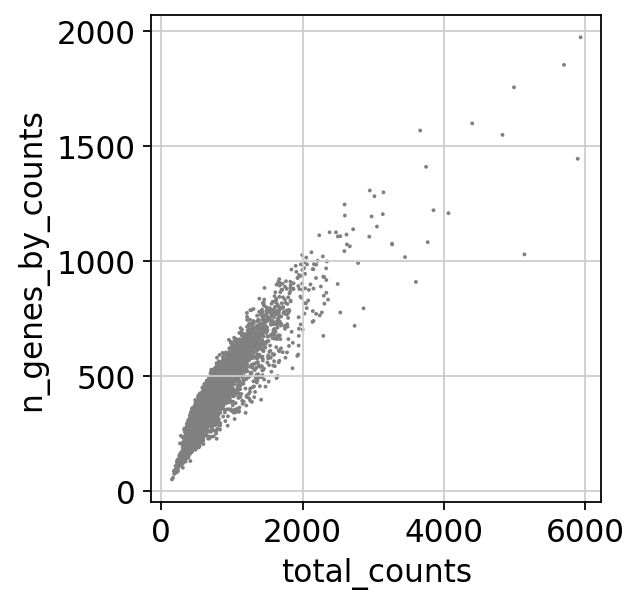

filtered out 16 cells that have less than 100 genes expressed
filtered out 3952 genes that are detected in less than 20 cells


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning:

Received a view of an AnnData. Making a copy.



normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


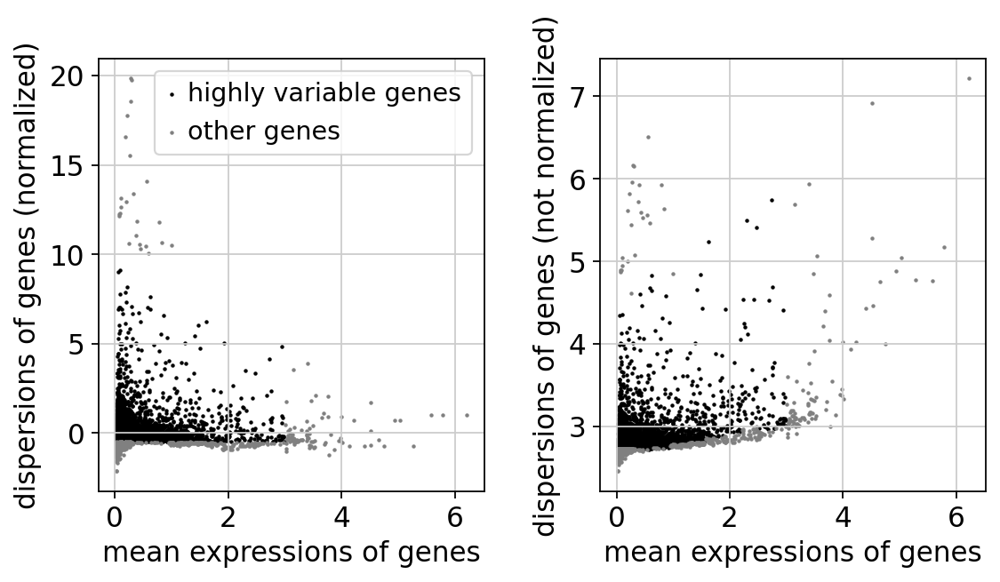

regressing out ['total_counts']
    finished (0:01:25)


In [48]:
sc.pl.highest_expr_genes(orthogroup_data.adata, n_top=20, )
orthogroup_data.violin()
orthogroup_data.cellgene_filter(min_genes=100, min_cells=20)
orthogroup_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
orthogroup_data.variable_filter(min_mean = 0.0125, max_mean = 3, min_disp = -0.5, max_disp = 10)
orthogroup_data.regress_scale(how = ['total_counts'], max_value = 10)

### Map cell type annotations

In [49]:
orthogroup_data.map_cellannots(sample_BFD.cellannot)

# 5B. Run PCA and UMAP/Leiden on exc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


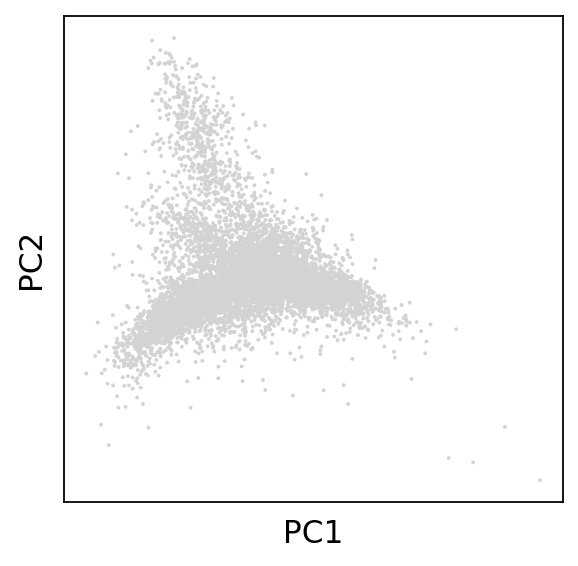

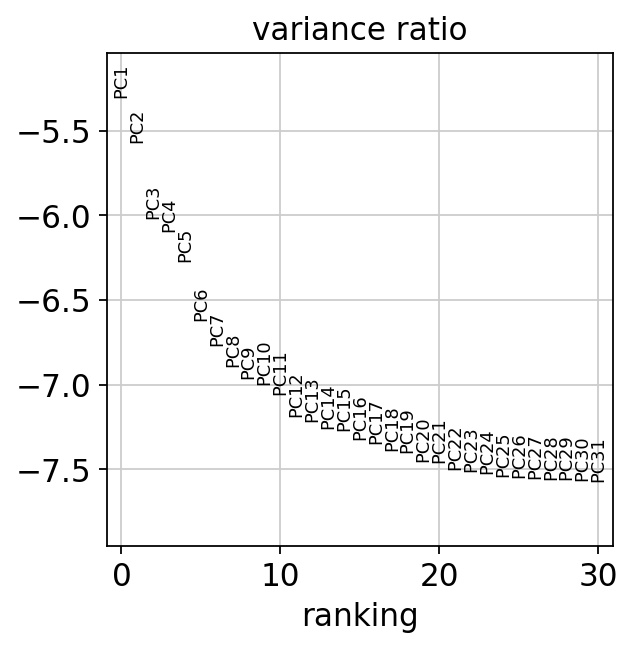

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:41)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


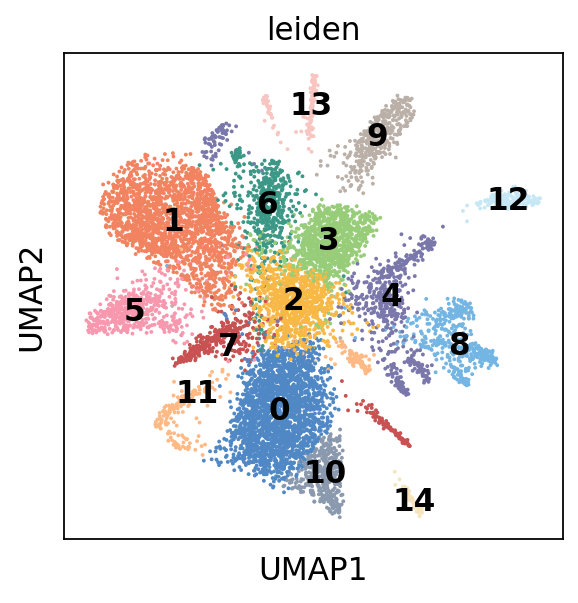

In [50]:
orthogroup_data.pca_basic()
orthogroup_data.umap_leiden(palette = list(apc.arcadia_All_ordered.keys()),
                           save_file = '_'.join([orthogroup_data.species_prefix, orthogroup_data.datatype, 'Orthogroup', 'leiden.pdf']))

# 6B. Map, then plot expression of glial markers in exc data

,gene_name,Orthogroup
2634,glula,OG0017169
4236,sox10,OG0014665
5423,gfap,OG0011271
17197,aplnra,OG0004819
18761,olig1,OG0011699
43513,myrf,OG0023968
44675,slc1a2b,OG0004873


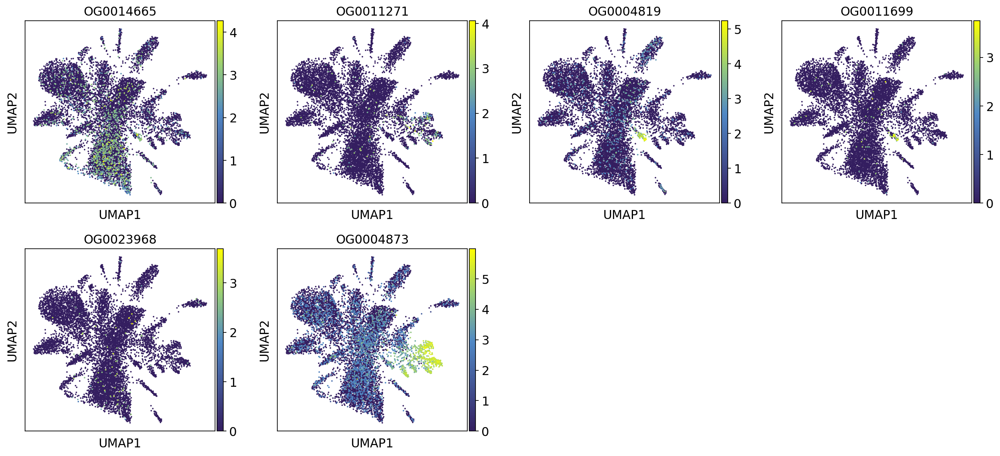

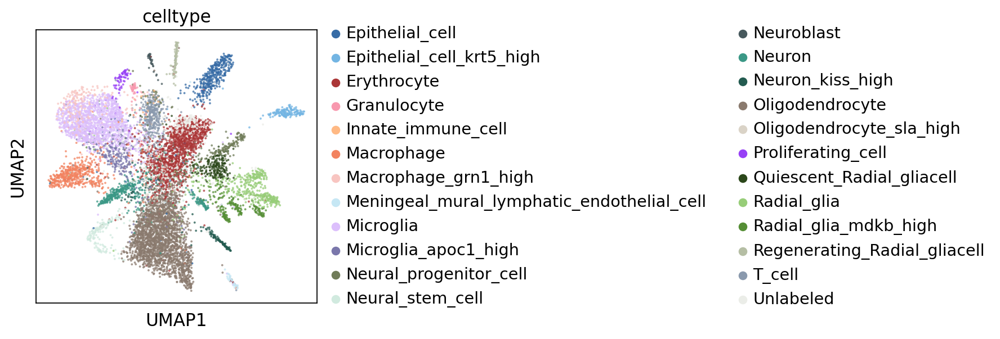

In [51]:
# Retrieve idmm object from BioFileDocket
idmm_object = sample_BFD.og_idmm

# Map gene names to orthogroup IDs
glial_og = orthogroup_data.map_gene_to_id(idmm_object, glial_markers, 'gene_name', 'Orthogroup')

# Plot cells by orthogroups
sc.pl.umap(orthogroup_data.adata, color=glial_og, cmap = 'arcadia:viridis',
          save = '_'.join([sample_BFD.species_prefix, 'OG', 'glial-markers', 'scatter.pdf']))

# Also plot celltype from cell annotation
sc.pl.umap(orthogroup_data.adata, color='celltype', alpha = 0.75, palette = celltype_palette,
          save = '_'.join([sample_BFD.species_prefix, 'OG', 'celltypes', 'scatter.pdf']))

### Generate confusion matrix

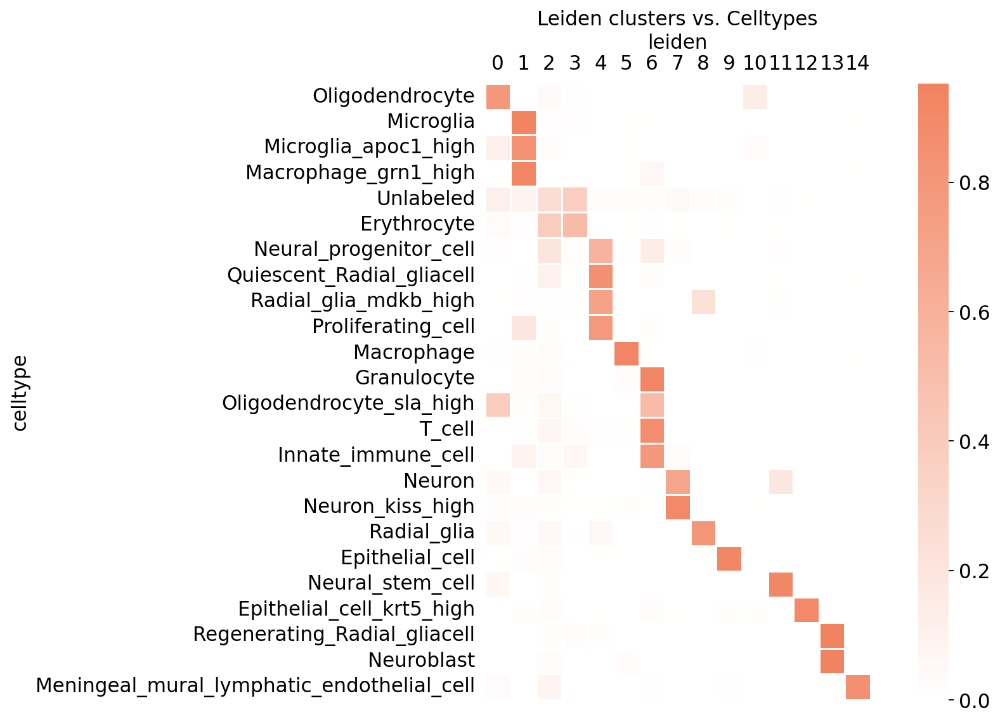

In [63]:
ctmx = sc.metrics.confusion_matrix("celltype", "leiden", orthogroup_data.adata.obs)
ctmx_diag = diagonalize_df(ctmx)

plt.figure(figsize = (12, 8))
sns.heatmap(ctmx_diag, square = True, cmap = 'arcadia:ambers', linewidth = 0.5)
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.tick_params(left = False, top = False)
plt.title('Leiden clusters vs. Celltypes')
plt.savefig(sample_BFD.directory + sample_BFD.species_prefix + '_Leiden-vs-Celltypes-confusion-Orthogroups.pdf')

### Generate hover-over confusion matrix using Plotly

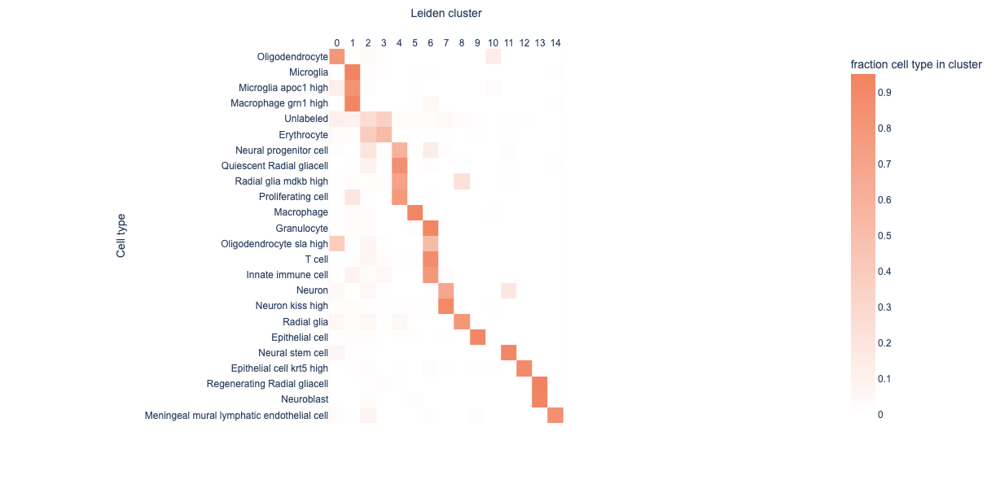

In [74]:
ctmx_diag.index = [label.replace('_', ' ') for label in ctmx_diag.index]
pxfig = px.imshow(ctmx_diag, labels = dict(x = "Leiden cluster", y = "Cell type", color = "fraction cell type in cluster"), color_continuous_scale = ['white', apc.arcadia_all['arcadia:amber']])
pxfig.update_layout(width = 750, height = 600)
try: 
    pxfig.update_layout(font=dict(family="Arial"))
except:
    pass
pxfig.update_xaxes(side = "top", title_text = "Leiden cluster")
pxfig.update_yaxes(title_text = "Cell type")

pxfig.write_html(sample_BFD.directory + sample_BFD.species_prefix + '_Leiden-vs-Celltypes-confusion-Orthogroups.html')
pxfig.show()

# 7B. Get top marker orthogroups and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


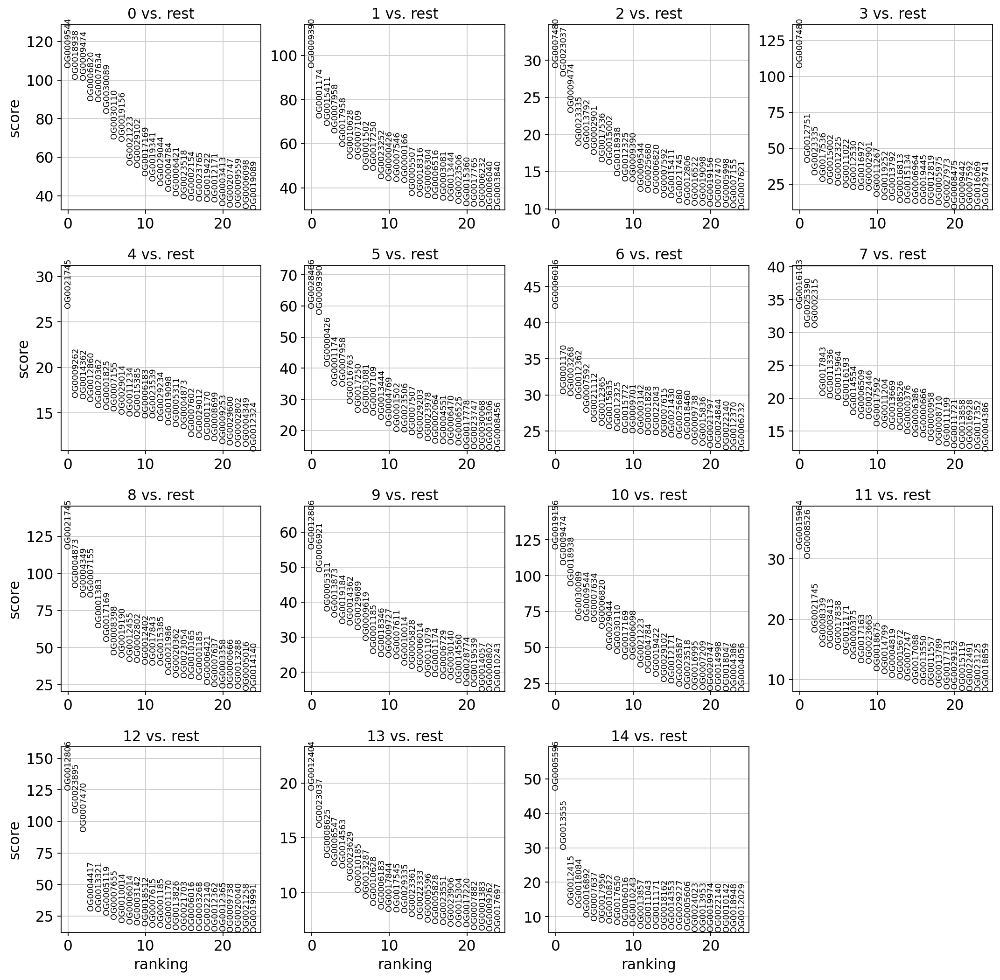

Wrote 953 gene ids to /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_OrthoFinder_top_100_Orthogroup_ids.txt
Wrote 1419 gene ids to /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_OrthoFinder_top_150_Orthogroup_ids.txt
Wrote 1867 gene ids to /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_OrthoFinder_top_200_Orthogroup_ids.txt
Wrote 1867 gene ids to /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_Exc_top_200DE_Orthogroup_ids.txt
Wrote 2294 gene ids to /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_OrthoFinder_top_250_Orthogroup_ids.txt
Wrote 2742 gene ids to /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_OrthoFinder_top_300_Orthogroup_ids.txt


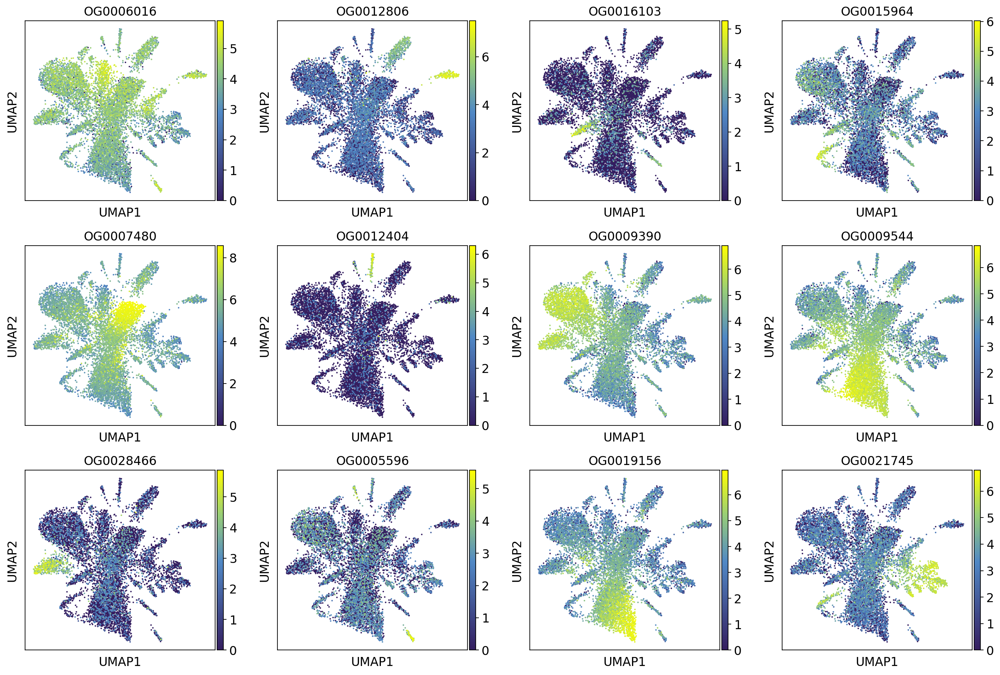

In [54]:
orthogroup_data.rank_genes()

top_number_ranges = [100, 150, 200, 250, 300]

for num in top_number_ranges:
    top_orthogroup_key, marker_orthogroup_key = orthogroup_data.get_top_genes('Orthogroup', top_number = num)
    
    filename_overwrite = '_'.join([scanpy_data.species_prefix, 'OrthoFinder', 'top', str(num), 'Orthogroup', 'ids.txt'])
    orthogroup_data.export_top_genes(top_orthogroup_key, filename_overwrite = filename_overwrite)
    
    if num == 200:
        orthogroup_data.export_top_genes(top_orthogroup_key)

    top_orthogroup_filekey = top_orthogroup_key + '_file'
    sample_BFD.add_keyfile(f'top{num}Orthogroups', getattr(orthogroup_data, top_orthogroup_filekey), overwrite = True)
    
    if num == 200:
        sample_BFD.add_keyfile('topOrthogroups', getattr(orthogroup_data, top_orthogroup_filekey), overwrite = True)

sc.pl.umap(orthogroup_data.adata, color=getattr(orthogroup_data, marker_orthogroup_key), cmap = 'arcadia:viridis')

In [55]:
sample_BFD.local_to_s3()
sample_BFD.pickle()
sample_BFD.push_to_s3(overwrite = False)

GCF_000002035.5_GRCz10_genomic.gff already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
GCF_000002035.5_GRCz10_genomic.fna already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
GSM3768152_Brain_8_dge.txt already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Drer_adultbrain_ZFIN_UniProtIDs.txt already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Drer_adultbrain_uniprot-idmm.tsv already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
Drer_adultbrain_gtf-idmm.tsv already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
GCF_000002035.5_GRCz10_genomic_cDNA.fna already exists in S3 bucket, skipping upload. set overwrite = True to overwrite the existing file.
GCF_000002035.5_GRCz10_genomic_cDNA.fna.transdecoder.bed already exists 

### Extract information about cluster membership

In [56]:
gxc_clusters = scanpy_data.adata.obs.copy(deep = True)
gxc_clusters['leiden'] = 'GeneClust_' + gxc_clusters['leiden'].astype('str')
gxc_clusters.rename(columns = {'leiden': 'leiden_genes'}, inplace = True)
gxc_clusters['cell_barcode'] = gxc_clusters.index
gxc_clusters = gxc_clusters[['cell_barcode', 'leiden_genes']].reset_index(drop = True)
display(gxc_clusters)

exc_clusters = orthogroup_data.adata.obs.copy(deep = True)
exc_clusters['leiden'] = 'OrthogroupClust_' + exc_clusters['leiden'].astype('str')
exc_clusters.rename(columns = {'leiden': 'leiden_orthogroups'}, inplace = True)
exc_clusters['cell_barcode'] = exc_clusters.index
exc_clusters = exc_clusters[['cell_barcode', 'leiden_orthogroups']].reset_index(drop = True)
display(exc_clusters)

merged_table = gxc_clusters.merge(exc_clusters, on = 'cell_barcode')
display(merged_table)

,cell_barcode,leiden_genes
0,ACAATATATTGTACCTGA,GeneClust_2
1,ACGTTGATGGCGTAGAGA,GeneClust_13
2,AACCTAACCTGAATTTGC,GeneClust_8
3,CTCGCAGCCCTCTATGTA,GeneClust_8
4,ACGTTGCGTATTTAGTCG,GeneClust_17
...,...,...
9993,AACCTATGGATGGGGTTT,GeneClust_3
9994,AAGCGGAGGACTCTCCAT,GeneClust_3
9995,ACCTGACTCGCAAGCGAG,GeneClust_3
9996,ACGTTGCAAAGTTTCATA,GeneClust_1


,cell_barcode,leiden_orthogroups
0,ACAATATATTGTACCTGA,OrthogroupClust_6
1,ACGTTGATGGCGTAGAGA,OrthogroupClust_12
2,AACCTAACCTGAATTTGC,OrthogroupClust_3
3,CTCGCAGCCCTCTATGTA,OrthogroupClust_3
4,ACGTTGCGTATTTAGTCG,OrthogroupClust_13
...,...,...
9979,AACCTATGGATGGGGTTT,OrthogroupClust_2
9980,AAGCGGAGGACTCTCCAT,OrthogroupClust_3
9981,ACCTGACTCGCAAGCGAG,OrthogroupClust_2
9982,ACGTTGCAAAGTTTCATA,OrthogroupClust_1


,cell_barcode,leiden_genes,leiden_orthogroups
0,ACAATATATTGTACCTGA,GeneClust_2,OrthogroupClust_6
1,ACGTTGATGGCGTAGAGA,GeneClust_13,OrthogroupClust_12
2,AACCTAACCTGAATTTGC,GeneClust_8,OrthogroupClust_3
3,CTCGCAGCCCTCTATGTA,GeneClust_8,OrthogroupClust_3
4,ACGTTGCGTATTTAGTCG,GeneClust_17,OrthogroupClust_13
...,...,...,...
9979,AACCTATGGATGGGGTTT,GeneClust_3,OrthogroupClust_2
9980,AAGCGGAGGACTCTCCAT,GeneClust_3,OrthogroupClust_3
9981,ACCTGACTCGCAAGCGAG,GeneClust_3,OrthogroupClust_2
9982,ACGTTGCAAAGTTTCATA,GeneClust_1,OrthogroupClust_1


### Generate Sankey plots

In [57]:
import plotly.graph_objects as go
import numpy as np

items = sorted(list(merged_table['leiden_genes'].unique())) + sorted(list(merged_table['leiden_orthogroups'].unique()))
items_dict = {items[i]: i for i in np.arange(0, len(items))}

source = []
target = []
value = []
color = []

for i in merged_table['leiden_genes'].unique():
    subtable = merged_table[merged_table['leiden_genes'] == i]
    values = pd.DataFrame(subtable['leiden_orthogroups'].value_counts())
    source = source + [items_dict[i] for j in np.arange(0, len(values))]
    target = target + [items_dict[k] for k in list(values.index.values)]
    value = value + list(values['leiden_orthogroups'].values)
    color = color + [apc.arcadia_Accent_all['arcadia:canary'] if i == max(values['leiden_orthogroups'].values) else apc.arcadia_Accent_all['arcadia:oat'] for i in values['leiden_orthogroups'].values]

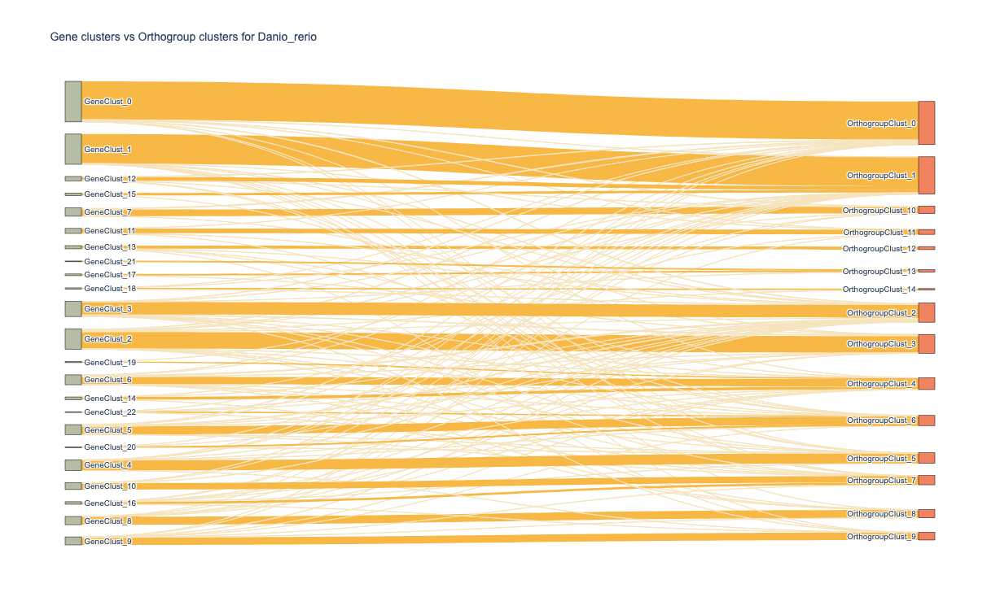

In [79]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = list(items_dict.keys()),
      color = [apc.arcadia_Accent_all['arcadia:amber'] if 'Orthogroup' in i else apc.arcadia_Accent_all['arcadia:sage'] for i in list(items_dict.keys()) ]
    ),
    link = dict(
      source = source,
      target = target,
      value = value,
      color = color
  ))])

config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '_'.join([sample_BFD.directory, sample_BFD.species_prefix, 'Gene-vs-OG-flow']),
  }
}

try: 
    fig.update_layout(font=dict(family="Arial"))
except:
    pass

fig.update_layout(title_text="Gene clusters vs Orthogroup clusters for " + sample_BFD.species, font_size=10, width=600, height=750)
fig.write_html('_'.join([sample_BFD.directory, sample_BFD.species_prefix, 'Gene-vs-OG-flow.html']))
fig.show(config=config)

### Display total genes and shared feature groups

In [59]:
total_genes = len([i for i in scanpy_data.adata.var.highly_variable if i == True])
total_ogs = len([i for i in orthogroup_data.adata.var.highly_variable if i == True])

display(total_genes, total_ogs)

11236

7936